# Reservoir routines: Hanazaki
***

**Author:** Chus Casado Rodríguez<br>
**Date:** 27-10-2023<br>

**Introduction:**<br>


**To do:**<br>
* [ ] Include evapotranspiration in the reservoir routine.
* [ ] The 20% that defines $V_e$ in the Hanazaki routine could be a calibration parameter.
* [ ] Include PDE (peak discharge error) as an evaluation metric: "mean of the absolute values of the relative error in the annual maximum discharge"

<font color='red'>**Reservoir 150 has simulated inflows that are excesively large compared with the reservoir capacity**</font>

In [27]:
import os
os.environ['USE_PYGEOS'] = '0'
import glob
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pathlib import Path
import geopandas as gpd
import yaml

from plots import maps_performance
from reservoirs.lisflood import Lisflood
from reservoirs.hanazaki import Hanazaki
from metrics import KGEmod, ECDF, PDE
from utils.utils import CDF, get_normal_value, return_period

import cartopy.crs as ccrs
import cartopy.feature as cf

## Configuration

In [9]:
with open('config_extraction.yml', 'r', encoding='utf8') as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)

path_res = Path(cfg['path_res'])
path_ts = Path(cfg['path_ts'])
# path_out = Path(cfg['path_out'])
# if path_out.exists() is False:
#     path_out.mkdir()
# var = cfg['var']

path_datasets = Path('Z:/nahaUsers/casadje/datasets/')

# study period
start = cfg['period']['start']
end = cfg['period']['end']

# # config plots
# proj = ccrs.PlateCarree()
# extent = [-125, -67.5, 24, 51]

# plots will be saved in this path
path_out = Path('GloFAS')
if path_out.exists() is False:
    path_out.mkdir()

In [10]:
# config plots
proj = ccrs.PlateCarree()
extent = [-125, -67.5, 24, 51]

## Data

### Base layers

In [11]:
catchment_pol = gpd.read_file('../GIS/catchments_US.shp')
catchment_pol = catchment_pol.to_crs(proj)#'epsg:4326')

### GloFAS

#### Reservoirs

In [12]:
# load shapefile of GloFAS reservoirs
reservoirs = gpd.read_file('../data/reservoirs/GloFAS/GloFAS_reservoirs.shp') 
reservoirs.set_index('ResID', drop=True, inplace=True)
reservoirs.rename(columns={'stor': 'CAP_GLWD'}, inplace=True)

# select only those reservoirs included in ResOpsUS
resopsus = gpd.read_file('../GIS/reservoirs_GloFAS_ResOpsUS.shp')
resopsus.set_index('ResID', drop=True, inplace=True)
mask = reservoirs.index.intersection(resopsus.index)
reservoirs = reservoirs.loc[mask]
reservoirs.GRAND_ID = reservoirs.GRAND_ID.astype(int)

print(f'{reservoirs.shape[0]} reservoirs')

112 reservoirs


#### Time series

In [13]:
# read GloFAS time series
path = Path('../data/reservoirs/GloFAS/long_run')
glofas_ts = {}
for file in tqdm(glob.glob(f'{path}/*.csv')):
    id = int(file.split('\\')[-1].split('.')[0].lstrip('0'))
    if id not in reservoirs.index:
        continue
    glofas_ts[id] = pd.read_csv(file, parse_dates=True, dayfirst=False, index_col='date')
    
print(f'{len(glofas_ts)} reservoirs')

  0%|          | 0/143 [00:00<?, ?it/s]

106 reservoirs


In [14]:
# check if reservoirs are missing
missing_reservoirs = reservoirs.index.difference(glofas_ts)
if len(missing_reservoirs) > 0:
    print(f'{len(missing_reservoirs)} reservoirs were not simulated in LISFLOOD')
    print(*missing_reservoirs)
reservoirs.drop(missing_reservoirs, axis=0, inplace=True)

6 reservoirs were not simulated in LISFLOOD
68 179 185 197 296 323


In [15]:
# # normalize inflow/outflow by the non-damaging outflow
# for id, df in glofas_ts.items():
#     df[['inflow', 'outflow']] /= reservoirs.loc[id, 'ndq']

#### Model parameters

In [16]:
# load static map of reservoirs
glofas_raster = xr.open_dataset(path_res)['res']

# extract an array of reservoir ID
ids = reservoirs.index.to_list()

# xr.DataArrays of reservoir longitudes and latitudes
lon = xr.DataArray(np.nan, dims=['ResID'], coords={'ResID': ids})
lat = xr.DataArray(np.nan, dims=['ResID'], coords={'ResID': ids})
for id in tqdm(ids):
    cell = glofas_raster.where(glofas_raster == id, drop=True)
    lon.loc[dict(ResID=id)] = cell.lon.data[0]
    lat.loc[dict(ResID=id)] = cell.lat.data[0]
coords = xr.Dataset({'lon': lon, 'lat': lat})

# extract parameter values
for par in ['adjustNormalFlood', 'ReservoirRnormqMult']:
    # load parameter map
    da = xr.open_dataset(f'Z:/nahaUsers/casadje/GloFASv4/parameters/{par}_GloFASv40.nc')[par]
    # extract values for each reservoir
    reservoirs[par] = da.sel(lon=lon, lat=lat, method='nearest').drop(['lon', 'lat']).to_pandas()

  0%|          | 0/106 [00:00<?, ?it/s]

In [17]:
# adjust normal limit and outflow with the calibrated parameters
reservoirs['nlim_adj'] = reservoirs.nlim + reservoirs.adjustNormalFlood * (reservoirs.flim - reservoirs.nlim)
reservoirs['normq_adj'] = pd.concat((reservoirs.normq * reservoirs.ReservoirRnormqMult, reservoirs.minq + .01), axis=1).max(axis=1)

### GRanD
#### Reservoirs

The shapefile of reservoirs in the GRanD data set is loaded to extract only the reservoir capacity reported in it.

In [18]:
# load GRanD data set
path_GRanD = path_datasets / 'reservoirs/GRanD/v1_3/'
grand = gpd.read_file(path_GRanD / 'grand_dams_v1_3.shp')
grand.set_index('GRAND_ID', drop=True, inplace=True)
grand = grand.replace(-99, np.nan)

# add GRanD capacity to the reservoirs
reservoirs['CAP_GRAND'] = grand.loc[reservoirs.GRAND_ID, 'CAP_MCM'].values

### ResOpsUS
#### Time series

In [19]:
path_ResOps = Path(path_datasets / 'reservoirs' / 'ResOpsUS')

resops_ts = {}
for glofas_id in tqdm(reservoirs.index):
    # load timeseries
    grand_id = reservoirs.loc[glofas_id, 'GRAND_ID']
    series_id = pd.read_csv(path_ResOps / 'time_series_all' / f'ResOpsUS_{grand_id}.csv', parse_dates=True, index_col='date')
    # remove empty time series
    series_id = series_id.loc[start:end]#.dropna(axis=1, how='all')
    # remove duplicated index
    series_id = series_id[~series_id.index.duplicated(keep='first')]
    # save in dictionary
    resops_ts[glofas_id] = series_id

  0%|          | 0/106 [00:00<?, ?it/s]

In [20]:
# approximate the ResOpsUS reservoir capacity as the maximum value in the records
reservoirs['CAP_RESOPS'] = pd.Series({id: df.storage.max() for id, df in resops_ts.items()})

In [21]:
# convert storage from hm3 to m3
for id, df in resops_ts.items():
    df.storage *= 1e6

***

In [54]:
from datetime import timedelta


In [59]:
selection_reservoirs = {}
min_days = 8 * timedelta(days = 365)
for ResID, df in tqdm(resops_ts.items()):
    df_ = df.copy()
    df_.dropna(axis=1, how='all', inplace=True)
    if ('outflow' in df_.columns) & ('storage' in df_.columns):
        start_V, end_V = df.storage.first_valid_index(), df.storage.last_valid_index()
        start_Q, end_Q = df.outflow.first_valid_index(), df.outflow.last_valid_index()
        start, end = max(start_V, start_Q), min(end_V, end_Q)
        if (end - start > min_days):
            selection_reservoirs[ResID] = {'start': start, 'end': end}

  0%|          | 0/107 [00:00<?, ?it/s]

In [60]:
len(selection_reservoirs)

94

***

### Correct reservoir capacity

In [22]:
try:
    # import DataFrame with the fraction fill and the selected data source
    ff = pd.read_excel('fraction_fill.xlsx', index_col='ResID')
except:
    # create DataFrame with the fraction fill according to each data source
    ff = pd.DataFrame(columns=['GLOFAS', 'GRAND'], dtype=float)
    ff.index.name = 'ResID'
    for id in reservoirs.index:
        cap_resops, cap_glofas, cap_grand = reservoirs.loc[id, ['CAP_RESOPS', 'CAP_GLWD', 'CAP_GRAND']]
        if np.isnan(cap_resops):
            continue
        ff.loc[id, :] = cap_resops / cap_glofas, cap_resops / cap_grand
    # export
    ff.to_excel('fraction_fill.xlsx', index=True)

In [23]:
# define de capacity  ('CAP') as that of the most reliable source
reservoirs['CAP'] = np.nan
for id in reservoirs.index:
    if ff.loc[id, 'selection'] == 'GLOFAS':
        reservoirs.loc[id, 'CAP'] = reservoirs.loc[id, 'CAP_GLWD']
    elif ff.loc[id, 'selection']:
        reservoirs.loc[id, 'CAP'] = reservoirs.loc[id, 'CAP_GRAND']

In [24]:
# convert storage time series into volume
for id, df in glofas_ts.items():
    df.storage *= reservoirs.loc[id, 'CAP'] * 1e6

## Reservoir routines

### Hanazaki

[Hanazaki et al. (2022)](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2021MS002944) developed a reservoir routine from that of Burek (LISFLOOD). The main differences are:
* The routine splits into two depending on the inflow, whether it exceeds the flood outflow or not.
* They introduce a release coefficient ($k$) that modulates the outflow under flood conditions ($I \ge Q_f$ and $V_f \le V \le V_e$).

#### Dummy example

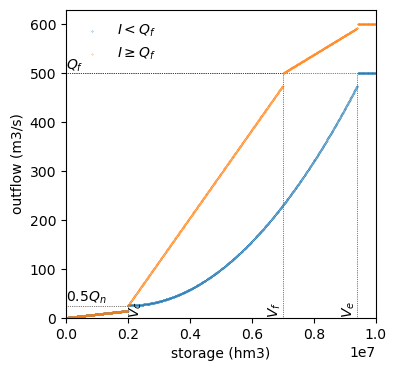

In [28]:
# volume limits (m3)
Vtot = 1e7
Vc = .2 * Vtot
Vf = .7 * Vtot
Ve = Vtot - .2 * (Vtot - Vf)

# outflow limits (m3/s)
Qn = 50
Qf = 500

# inflow (m3/s)
I = 1.1 * Qf

# release coefficient
k = .2

# catchment area (m2)
A = 200 * 1e6

# declare the reservoir
dummy_hnzk = Hanazaki(Vc, Vf, Ve, Vtot, Qn, Qf, A, )

# plot dummy routine
dummy_hnzk.plot_routine(modified=False, figsize=(4, 4))

The reservoir routine in Hanazaki's approach behaves differently depending on whether the inflow exceeds the flood outflow ($Q_f$)or not. 
* If the storage is below $V_c$, the routine is the same for both cases. The outflow is a linear function of storage specified by the pair of points [0, 0] and [$V_f$, $Q_n$]. At $V_c$ there's a jump in the outflow unless $\frac{V_c}{V_f}=0.5$.
* If the storage exceeds $V_c$, the reservoir behaves differently depending on the inflow:
    * If $I<Q_f$, the outflow is a quadratic function of the storage with two reference points: [$V_c$, $0.5 \cdot Q_n$], [$V_e$, $Q_f-0.5 \cdot Q_n$]. When the storage $V_e$ is reached, the outflow is fixed to $Q_f$. This approach has two jumps in the outflow: the previously mentioned jump at $V_c$ and another jump at $V_e$.
    * If $I \ge Q_f$, the outflow is a linear function of the storage. Up until $V_f$, the linear function has two supporting points: [$V_c$, $0.5 \cdot Q_n$], [$V_f$, $Q_f-0.5 \cdot Q_n$]. Between $V_f$ and $V_e$, the slope of the linear function depends on the $k$ release coefficient and the difference between the inflow and $Q_f$. When $V_e$ is exceeded, the outflow is equal to the inflow. This approach has up to three jumps: that at $V_c$ already mentioned, another at $V_f$, and a last one at $V_e$.
    
><font color='maroon'>**IDEA**</font>.Why are those breaks in the outflow function necessary? They could be avoided if the $0.5 \cdot Q_n$ term would be replaced by $\frac{V_c}{V_f} \cdot Q_n$, and if the term $\left(Q_f-Q_n\right)$ were replaced by $\left(Q_f - \frac{V_c}{V_f} \cdot Q_n\right)$

I have applied the previous idea and created a "modified" Hanazaki routine. Below a plot that shows the modified routine.

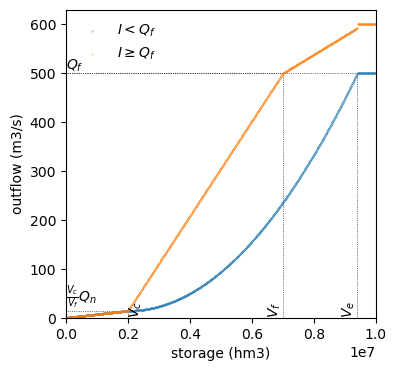

In [29]:
# plot dummy routine
dummy_hnzk.plot_routine(modified=True)

> **Note**. The break at $V_e$ when the inflow exceeds the flood outflow is caused by the release coefficient ($k=0.925$).

#### Real reservoir

Now I will test Hanazaki's routine with the same reservoir from ResOpsUS that I tested the LISFLOOD routine. Since in this case we do not have calibrated parameters to define the conservation ($V_c$) and flood storage ($V_f$), nor the normal ($Q_n$) and flood outflows ($Q_f$), I will define them as quantiles of the observed storage and inflow time series, respectively.

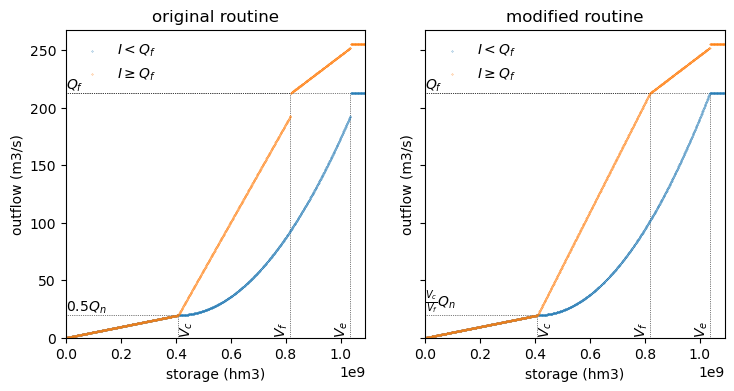

In [30]:
# GloFAS reservoir
ResID = 146

# storage limits (m3)
Vtot = reservoirs.loc[ResID, 'CAP'] * 1e6
Vf = resops_ts[ResID].storage.quantile(.75)
Ve = Vtot - .2 * (Vtot - Vf)
Vc = .5 * Vf

# outflow limits
Qn = resops_ts[ResID].inflow.mean()
Q100 = return_period(resops_ts[ResID].inflow, T=100)
Qf = .3 * Q100

# catchment area (m2)
grand_id = reservoirs.loc[ResID, 'GRAND_ID'].astype(int)
A = grand.loc[grand_id, 'CATCH_SKM'] * 1e6

# declare reservoir
res = Hanazaki(Vc, Vf, Ve, Vtot, Qn, Qf, A)

# plot routines
fig, ax = plt.subplots(ncols=2, figsize=(8.5, 4), sharey=True)
res.plot_routine(ax=ax[0], modified=False)
ax[0].set_title('original routine')
res.plot_routine(ax=ax[1], modified=True)
ax[1].set_title('modified routine');

The left plot shows the original routine in Hanazaki's paper. As explained above, that routine has some breaks in the outflow function, which may not be realistic. The right plot shows a modification I've done on the routine so those breaks are removed.

##### Simulation

As in the LISFLOOD routine, I will use both the observed and simulated inflow time series as input to the Hanazaki routine. In both cases I will use the modified approach.

In [31]:
# observed and LISFLOOD simulated time series
obs = resops_ts[ResID][['storage', 'inflow', 'outflow']]
sim = glofas_ts[ResID][['storage', 'inflow', 'outflow']]

# # normalize observed time series
# obs_ = obs.copy()
# obs_.storage /= res.Vtot
# obs_[['inflow', 'outflow']] /= res.Qf

**Simulation using as inflow the GloFAS data**

  0%|          | 0/13878 [00:00<?, ?it/s]

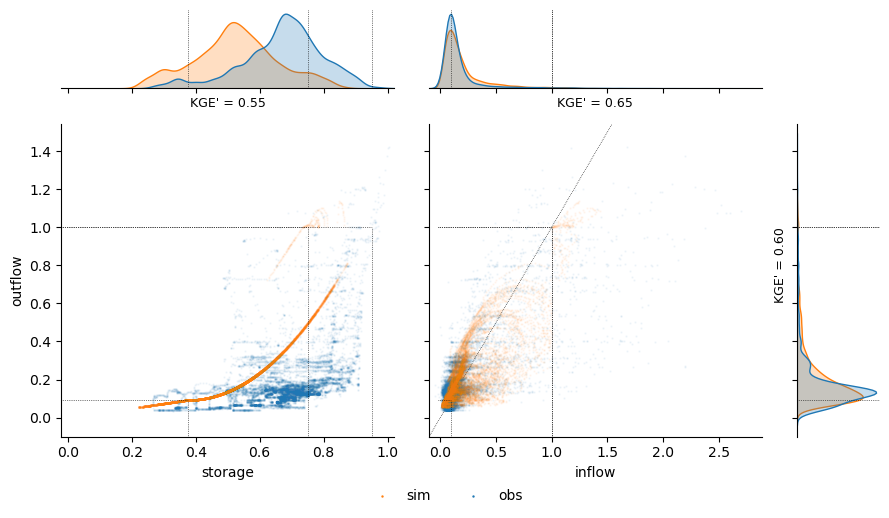

In [32]:
# simulate the reservoir
hnzk1 = res.simulate(sim.inflow, obs.storage[0])

# analyse simulation
res.compare(hnzk1, obs)

First of all, the parameters I defined for the Hanazaki reservoirs were based in the observed distribution of storage and outflow, they are not random. Therefore, even if not calibrated parameters, they are a set of parameters based on some experience.

The Hanazaki simulation outperforms that from the LISFLOOD routine both in terms of outflow and storage. The improvement in outflow in marginal, but the improvement in terms of storage is huge (KGE of 0.62 instead of 0.12). The outflow KGE is still lower than that of inflow, which means that the routine losses some information. To quantify this loss I will rerun the model using as input inflow the observation.

**Simulation using as inflow the ResOpsUS records**

  0%|          | 0/13878 [00:00<?, ?it/s]

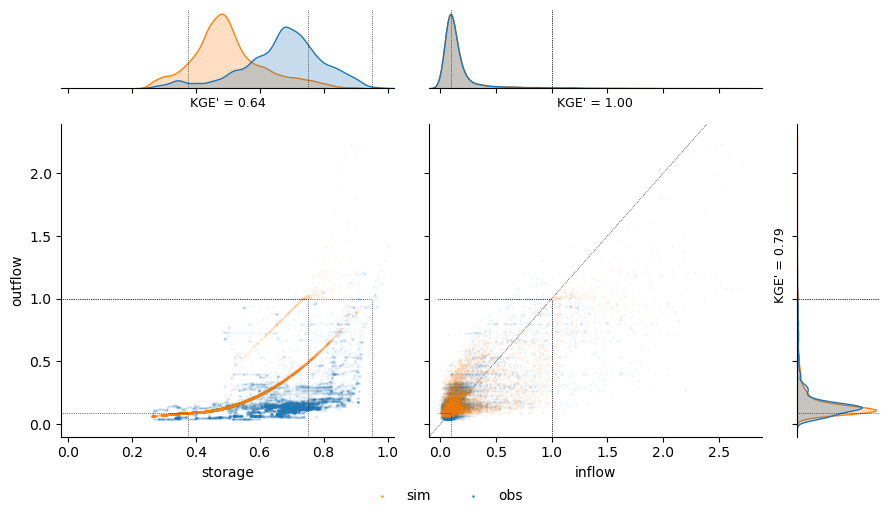

In [33]:
# simulate the reservoir
hnzk2 = res.simulate(obs.inflow, obs.storage[0])

# analyse simulation
res.compare(hnzk2, obs)

The results are similar, Hanazaki's routine outpeforms LISFLOOD both in terms of outflow and storage. The storage KGE is almost equal when using observed or simulated inflows. The outflow KGE, instead, increases from 0.63 to 0.83; still, there's a loss of information in this routine.

In general, both routines simplify excesively the relation between storage and outflow. The scatter plots show that there is considerable dispersion between these two variables, whereas both routines approximate it by linear/quadratic functions. The fact that the Hanazaki routine has two different subroutines allows for a slight larger dispersion, but it still differs from the real reservoir functioning.

It is interesting the dispersion in the plots inflow-outflow in the Hanazaki's routine, which did not exist in LISFLOOD.

### All GloFAS4 & ResOpsUS

In [34]:
path_hanazaki = Path('../results/reservoirs/Hanazaki')

path_plots = path_hanazaki / 'behaviour'
if path_plots.exists() is False:
    path_plots.mkdir()

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/10592 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13516 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12118 [00:00<?, ?it/s]

  0%|          | 0/13149 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/10667 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/11688 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12145 [00:00<?, ?it/s]

E:\casadje\GitHub\LF_water_bodies\notebook\plots.py:622: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


  0%|          | 0/12875 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12782 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/1233 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12783 [00:00<?, ?it/s]

  0%|          | 0/12935 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/11780 [00:00<?, ?it/s]

  0%|          | 0/13849 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12739 [00:00<?, ?it/s]

  0%|          | 0/13180 [00:00<?, ?it/s]

  0%|          | 0/8491 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/7214 [00:00<?, ?it/s]

  0%|          | 0/7998 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/4748 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12237 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12740 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/12783 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13606 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

  0%|          | 0/13878 [00:00<?, ?it/s]

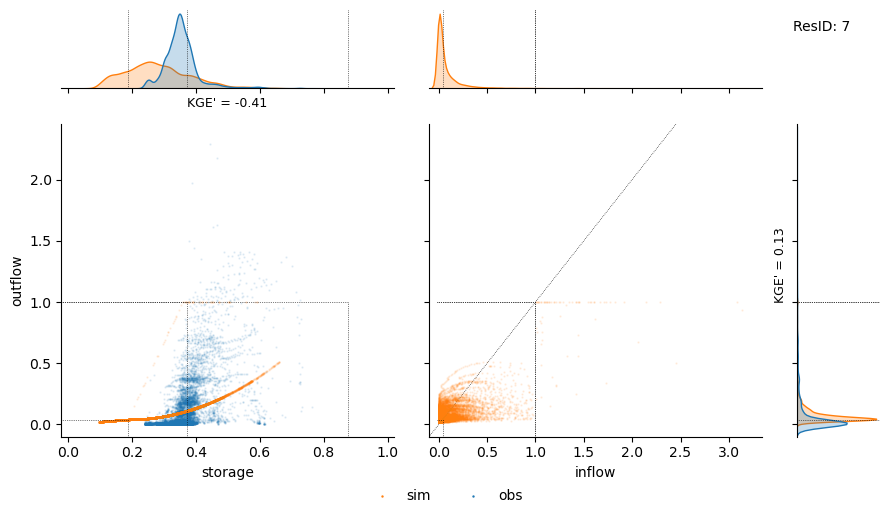

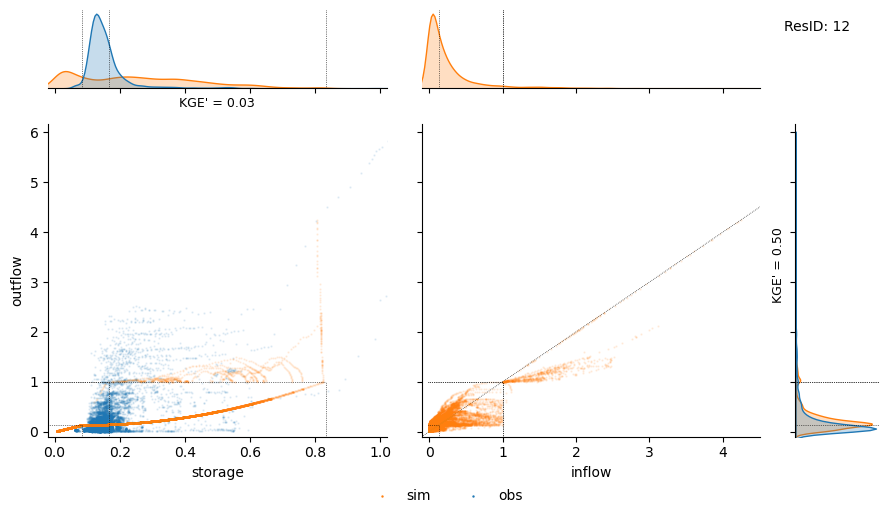

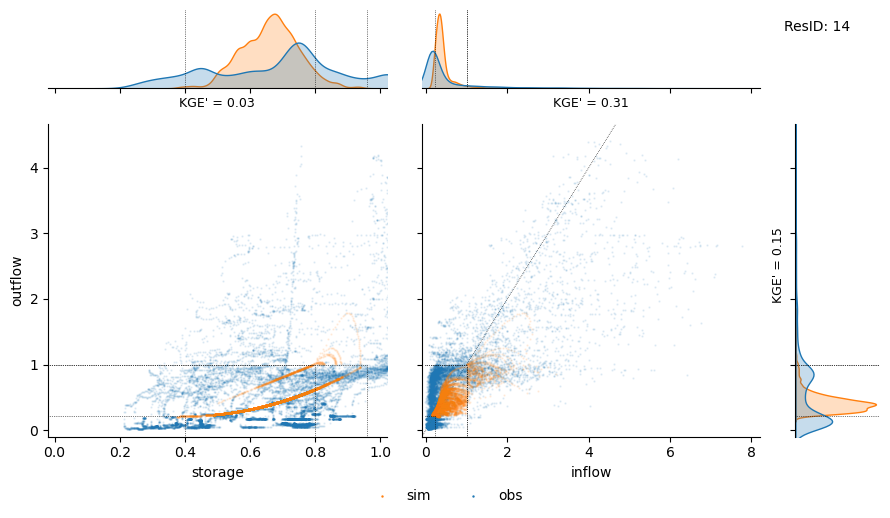

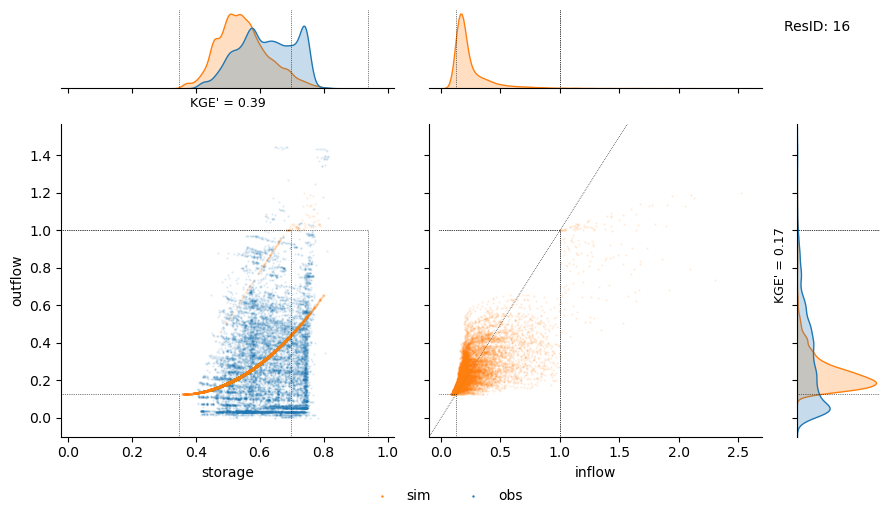

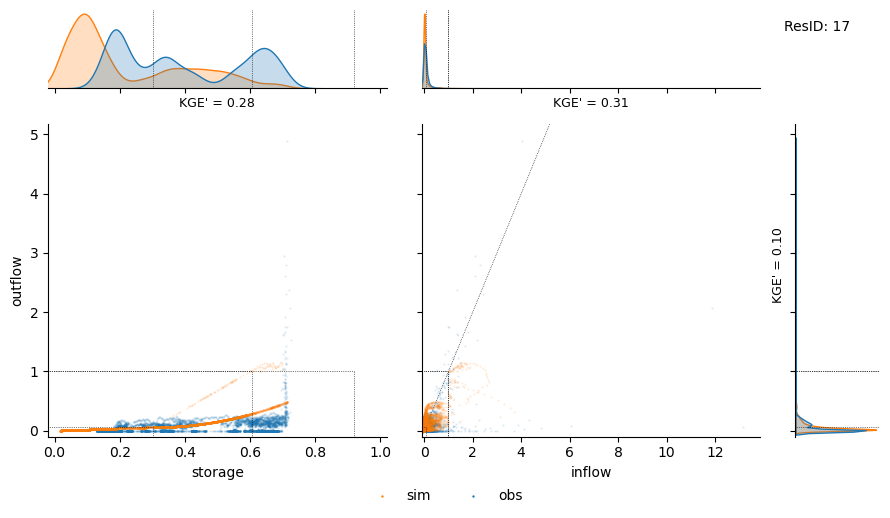

...

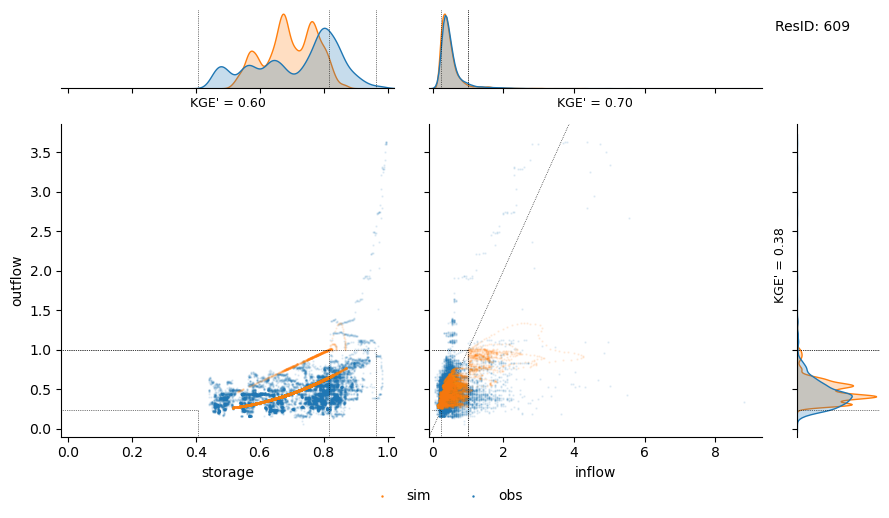

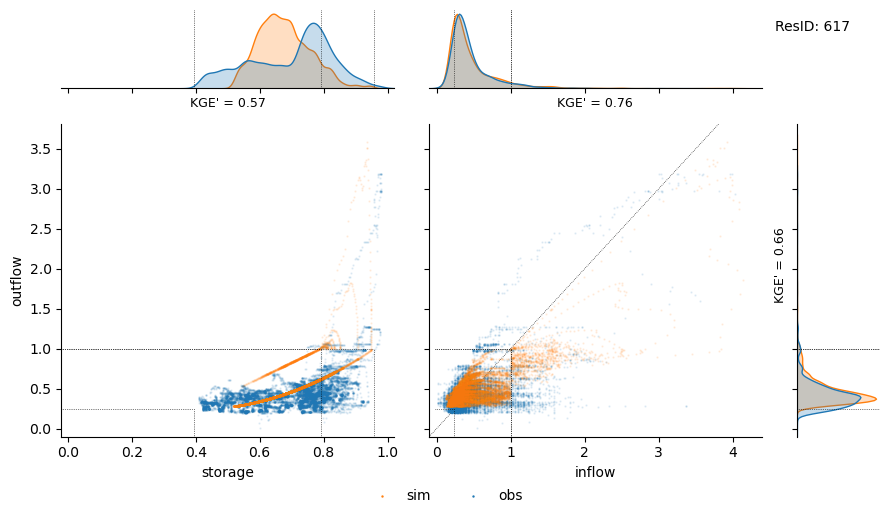

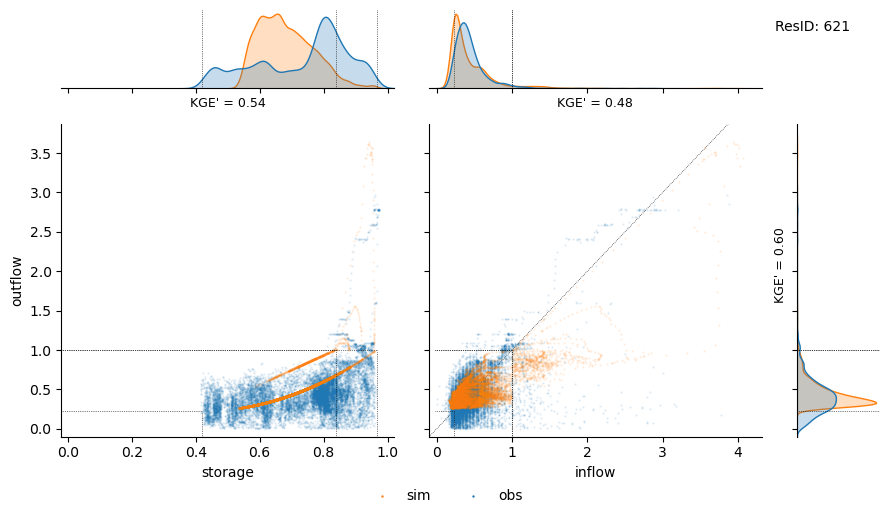

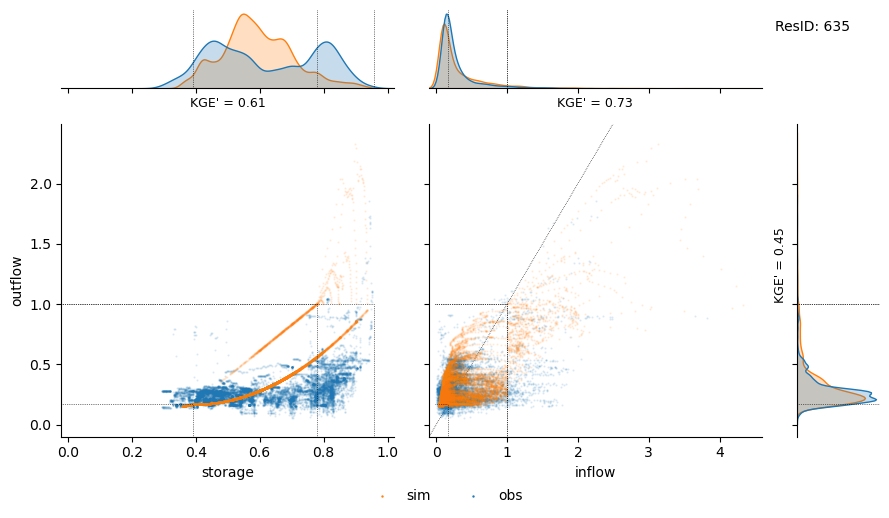

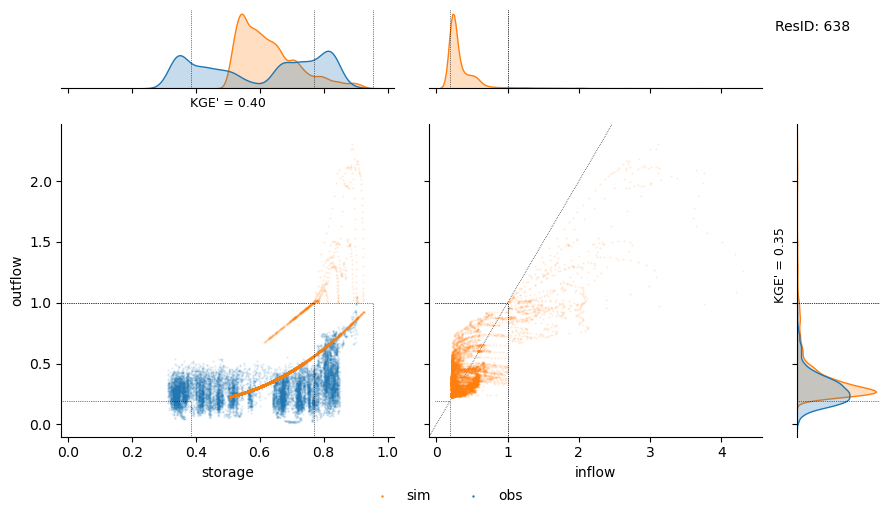

In [35]:
hanazaki_res = {}
hanazaki_ts = {}
for ResID in tqdm(reservoirs.index):
    
    # observed and LISFLOOD simulated time series
    obs = resops_ts[ResID][['storage', 'inflow', 'outflow']]
    start = obs.storage.first_valid_index()
    sim_lf = glofas_ts[ResID][['storage', 'inflow', 'outflow']]
    
    # storage limits (m3)
    Vtot = reservoirs.loc[ResID, 'CAP'] * 1e6
    Vf = obs.storage[start:].quantile(.75)
    Ve = Vtot - .2 * (Vtot - Vf)
    Vc = .5 * Vf

    # outflow limits
    Qn = sim_lf.inflow.mean()
    Q100 = return_period(sim_lf.inflow, T=100)
    Qf = .3 * Q100

    # catchment area (m2)
    grand_id = reservoirs.loc[ResID, 'GRAND_ID'].astype(int)
    A = grand.loc[grand_id, 'CATCH_SKM'] * 1e6

    # declare the reservoir
    res = Hanazaki(Vc, Vf, Ve, Vtot, Qn, Qf, A)

    # simulate the reservoir
    sim = res.simulate(sim_lf.inflow[start:], obs.storage[start])
    
    try:
        # analyse simulation
        res.compare(sim,
                    obs,
                    alpha=.1,
                    title=f'ResID: {ResID}',
                    save=path_plots / f'{ResID:03}.jpg')
    except:
        print(ResID)
        continue
        
    # organize results
    hanazaki_res[ResID] = res
    hanazaki_ts[ResID] = sim

In [36]:
# export simulated time series
path_ts = path_hanazaki / 'timeseries'
for ResID, ts in tqdm(hanazaki_ts.items()):
    ts.to_csv(path_ts / f'{ResID:03}.csv', float_format='%.3f')

  0%|          | 0/106 [00:00<?, ?it/s]

In [37]:
# generate table of reservoir parameters
hanazaki_pars = pd.DataFrame({ResID: res.get_params() for ResID, res in hanazaki_res.items()}).transpose()
hanazaki_pars.index.name = 'ResID'
hanazaki_pars[['Vc', 'Vf', 'Ve', 'Vtot']] = hanazaki_pars[['Vc', 'Vf', 'Ve', 'Vtot']].astype(int)
hanazaki_pars[['Qn', 'Qf']] = hanazaki_pars[['Qn', 'Qf']].round(1)
hanazaki_pars['k'] = hanazaki_pars['k'].round(3)

# export reservoir parameters
path_tables = path_hanazaki / 'tables'
if path_tables.exists() is False:
    path_tables.mkdir()
for par in hanazaki_pars.columns:
    # hanazaki_pars[par].round(r).to_csv(path_tables / f'{par}.txt', header=None, sep='\t')
    hanazaki_pars[par].to_csv(path_tables / f'{par}.txt', header=None, sep='\t')

#### Performance

In [38]:
Performance_glofas = {}
for var in ['storage', 'inflow', 'outflow']:
           
    # compute performance
    performance = pd.DataFrame(index=reservoirs.index, columns=['KGE', 'alpha', 'beta', 'r'], dtype=float)
    for id in tqdm(performance.index):
        if (id in resops_ts) & (id in glofas_ts):
            obs, sim = resops_ts[id][var], glofas_ts[id][var]
            if obs.isnull().all() or sim.isnull().all():
                continue
            performance.loc[id,:] = KGEmod(obs, sim)
    Performance_glofas[var] = performance
    print('no. reservoirs with {0} data:\t{1}'.format(var, performance.dropna(axis=0).shape[0]))

  0%|          | 0/106 [00:00<?, ?it/s]

no. reservoirs with storage data:	106


  0%|          | 0/106 [00:00<?, ?it/s]

no. reservoirs with inflow data:	62


  0%|          | 0/106 [00:00<?, ?it/s]

no. reservoirs with outflow data:	96


In [39]:
# output path
path = path_hanazaki / 'performance'
if path.exists() is False:
    path.mkdir()

  0%|          | 0/106 [00:00<?, ?it/s]

no. reservoirs with storage data:	106


  0%|          | 0/106 [00:00<?, ?it/s]

no. reservoirs with inflow data:	62


  0%|          | 0/106 [00:00<?, ?it/s]

no. reservoirs with outflow data:	96


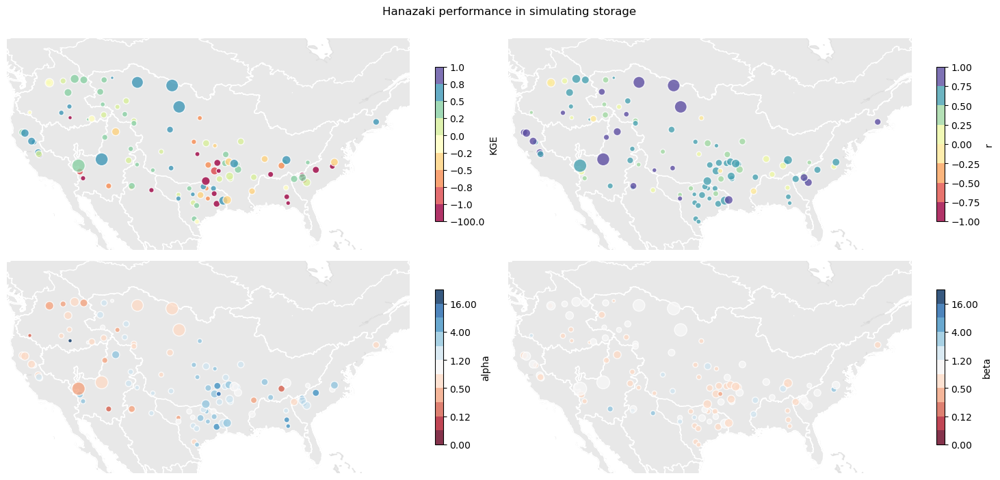

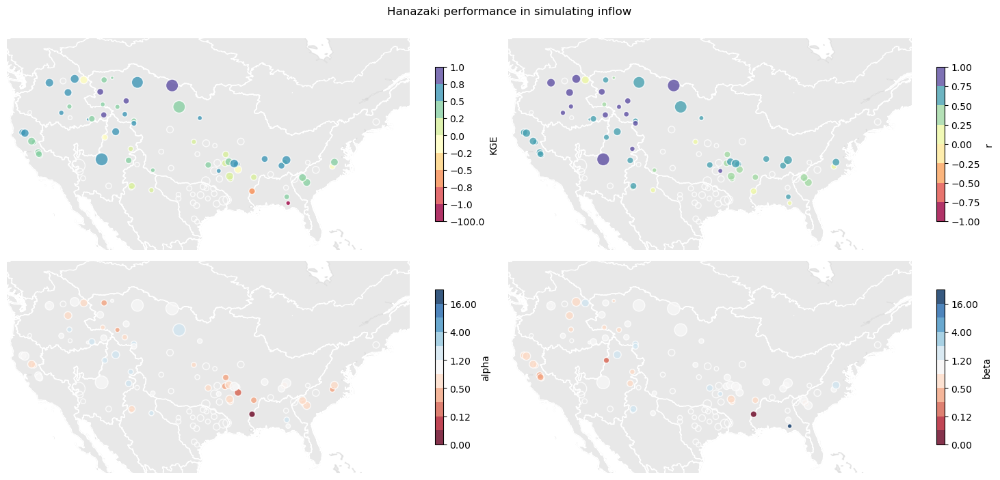

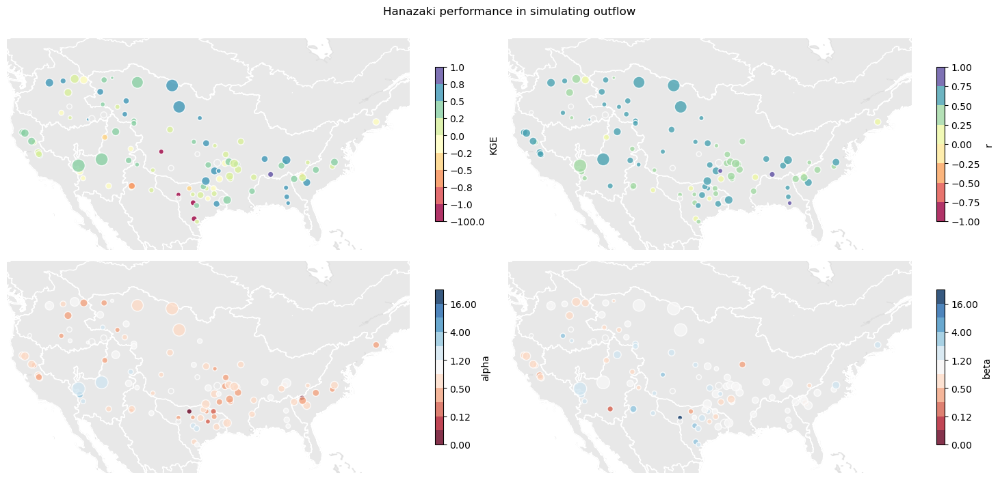

In [40]:
Performance_hanazaki = {}
for var in ['storage', 'inflow', 'outflow']:
           
    # compute performance
    performance = pd.DataFrame(index=reservoirs.index, columns=['KGE', 'alpha', 'beta', 'r'], dtype=float)
    for id in tqdm(performance.index):
        if (id in resops_ts) & (id in hanazaki_ts):
            obs, sim = resops_ts[id][var], hanazaki_ts[id][var]
            if obs.isnull().all() or sim.isnull().all():
                continue
            performance.loc[id,:] = KGEmod(obs, sim)
    Performance_hanazaki[var] = performance
    print('no. reservoirs with {0} data:\t{1}'.format(var, performance.dropna(axis=0).shape[0]))
    
    # performance maps
    title = f'Hanazaki performance in simulating {var}'
    file = path / f'maps_{var}.jpg'
    maps_performance(reservoirs.geometry.x, reservoirs.geometry.y, performance, s=reservoirs.CAP**.5,
                     polygons=catchment_pol, extent=extent, title=title, save=file)

#### Compare performance

In [42]:
Performance = {'GloFAS': Performance_glofas,
               'Hanazaki': Performance_hanazaki}

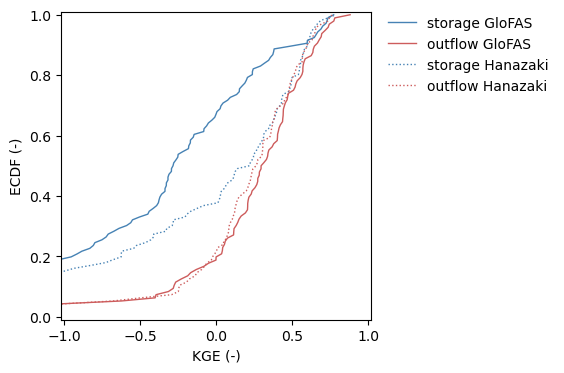

In [52]:
var_color = {'inflow': 'gold', 'outflow': 'indianred', 'storage': 'steelblue'}

fig, ax = plt.subplots(figsize=(4, 4))

for (model, dct), ls in zip(Performance.items(), ['-', ':']):
    for var, df in dct.items():
        if var == 'inflow':
            continue
        ecdf = ECDF(df['KGE'], plot=False)
        ax.plot(ecdf.values, ecdf.index, c=var_color[var], lw=1, ls=ls, label=f'{var} {model}')
        
ax.set(xlim=(-1.02, 1.02),
       xlabel='KGE (-)',
       ylim=(-.01, 1.01),
       ylabel='ECDF (-)')
fig.legend(frameon=False, loc=1, bbox_to_anchor=[1.175, .5, .2, .4]);

plt.savefig(path / 'KGE_Hanazaki_vs_GloFAS.jpg', dpi=300, bbox_inches='tight')

The performance of the Hanazaki model is very similar, but slighly lower, than GloFAS for the outflow, but it's clearly higher for the reservoir storage. This results contrast with the fact that the reservoirs in GloFAS were calibrated (2 of the parameters in the reservoir routine), whereas in the Hanazaki model I have used directly the specification explained in the article. It is true, though, that the derivation of the Hanazaki reservoir parameters is based on observed storage data, a data to which GloFAS was never exposed.

Apart from the general performance of the reservoir, it is of special interest to analyse the peak discharge. I will compare the peak discharge error ($PDE$) for the GloFAS and Hanazaki simulations:

$$
PDE = \frac{1}{n} \cdot \sum_{i=1}^{n} \left| Q_{i,obs} - Q_{i,sim} \right|
$$

In [33]:
# peak discharge error
pde = pd.DataFrame(index=list(hanazaki_ts), columns=['GloFAS', 'Hanazaki'])
for ResID in pde.index:
    obs = resops_ts[ResID].outflow
    sim_lf = glofas_ts[ResID].outflow
    sim_hnzk = hanazaki_ts[ResID].outflow
    pde.loc[ResID, 'GloFAS'] = PDE(obs, sim_lf)
    pde.loc[ResID, 'Hanazaki'] = PDE(obs, sim_hnzk)
# replace infinite values by NaN
pde = pde.replace([np.inf, -np.inf], np.nan)

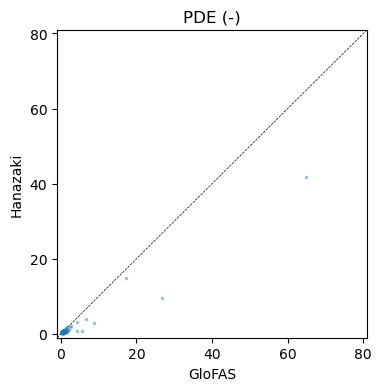

In [34]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(pde.GloFAS, pde.Hanazaki, s=3, alpha=.33)
r = 20
vmax = np.ceil(pde.max(skipna=True).max(skipna=True) / r) * r + 1
ticks = np.arange(0, vmax, r)
ax.plot([-1, vmax], [-1, vmax], '--k', lw=.5, zorder=0)
ax.set(xlim=(-1, vmax),
       xlabel='GloFAS',
       ylim=(-1, vmax),
       ylabel='Hanazaki',
       title='PDE (-)',
       xticks=ticks,
       yticks=ticks);

plt.savefig(path / 'PDE_Hanazaki_vs_GloFAS.jpg', dpi=300, bbox_inches='tight')

### POT

In [35]:
from scipy import stats
import sys
sys.path.append('../../Estadistica/src')
from POT import POT

In [36]:
ResID = 146

In [37]:
var = 'outflow'
series = {'ResOpsUS': resops_ts[ResID][var],
          'GloFAS': glofas_ts[ResID][var],
          'Hanazaki': hanazaki_ts[ResID][var]}

In [38]:
pots = {}
threshold = hanazaki_res[ResID].Qf
discrete = stats.poisson
continuous = stats.expon

for title, ts in series.items():
    # declare the POT
    pot = POT(ts, discrete, continuous, threshold)

    # find events
    events = pot.select_peaks(days=7, plot=False)

    # fit discrete distribution
    mu = pot.fit_discrete(plot=False)

    # ajustar la distribución continua
    pars = pot.fit_continuous(plot=False)
    
    pots[title] = pot

mu = 0.605
E(m) = 0.605	var(m) = 0.605	mu3 = 1.286
La distribución Poisson es adecuada para el nº anual de eventos
mu = 0.815
E(m) = 0.815	var(m) = 0.815	mu3 = 1.107
La distribución Poisson es adecuada para el nº anual de eventos
mu = 0.658
E(m) = 0.658	var(m) = 0.658	mu3 = 1.233
La distribución Poisson es adecuada para el nº anual de eventos


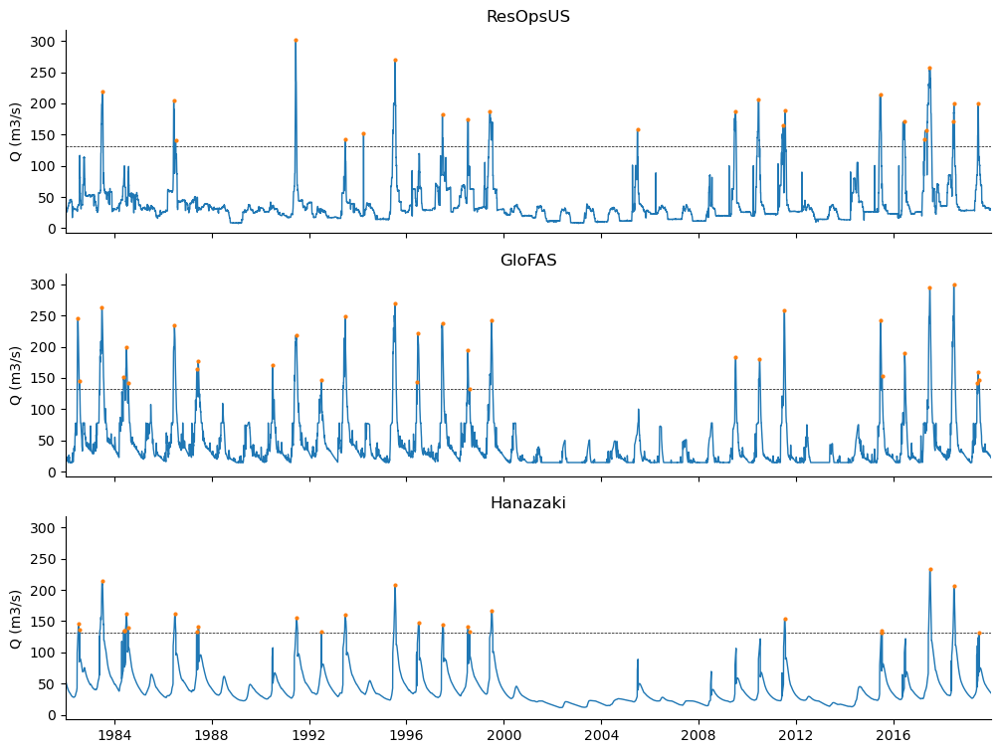

In [39]:
fig, axes = plt.subplots(nrows=3, figsize=(12, 9), sharex=True, sharey=True)

for ax, (title, pot) in zip(axes, pots.items()):
    ax.plot(pot.series, lw=1)
    ax.scatter(pot.peaks.index, pot.peaks.values, c='C1', s=4, zorder=2)
    ax.axhline(pot.threshold, c='k', ls='--', lw=.5, zorder=0)
    ax.set_ylabel('Q (m3/s)')
    ax.set_title(title)
    ax.spines[['top', 'right']].set_visible(False)
ax.set(xlim=(pot.series.index.min(), pot.series.index.max()));

In [44]:
vmax = np.max([ts.max() for title, ts in series.items()])
# xs = np.linspace(threshold, vmax, 100)
xs = np.linspace(0, vmax * 2, 100)
Tr = 5

cdfs = {}
Qt = {}
for title, pot in pots.items():
    # compute CDF
    cdfs[title] = pot.cdf(xs)
    
    # valor para un retorno de 100 años-> cdf = 0.99
    Qt[title] = pot.ppf([1 - 1 / Tr]).iloc[0]

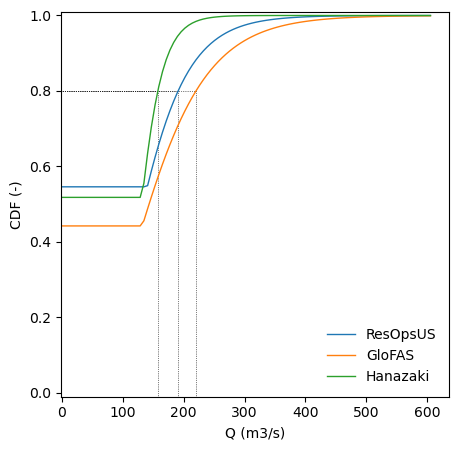

In [45]:
fig, ax = plt.subplots(figsize=(5, 5))
for (label, cdf), c in zip(cdfs.items(), ['k', 'C0', 'C1']):
    ax.plot(xs, cdf, lw=1, label=label)
    ax.vlines(Qt[label], -.01, 1 - 1 / Tr, color='k', lw=.5, ls=':', zorder=0)
    ax.hlines(1 - 1 / Tr, -1, Qt[label], color='k', lw=.5, ls=':', zorder=0)
ax.set(xlim=(-1, None),
       xlabel='Q (m3/s)',
       ylim=(-.01, 1.01),
       ylabel='CDF (-)')
ax.legend(loc=4, frameon=False);